# PREDICCION DE PRECIOS DE AGUACATE EN EEUU





# Enunciado del Problema

- Los datos representan ventas semanales desde 2015 a 2018 a nivel de todos los EEUU. 
- Los datos provienen directamente de las cajas registradoras basados en ventas de aguacate variedad Hass. 
- El precio promedio de los aguacates reflejan el costo por unidad, aún cuando estos se vendan por bolsas. 
- Los códigos (Product Lookup codes ó PLU) en la tabla son solo de aguacates Hass.  No se incluyen otras variedades.

Columnas relevantes en el conjunto de datos:

- Date - la fecha de la observación
- AveragePrice - el precio promedio de una unidad
- type - convencional u orgánico
- year - el año
- Region - la ciudad o región de la observación
- Total Volume - número total de aguacates vendidos
- 4046 - número total de aguacates con PLU 4046 vendidos
- 4225 - número total de aguacates con PLU 4225 vendidos
- 4770 - número total de aguacates con PLU 4770 vendidos



# Importar las librerías

In [6]:

# ! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [7]:
# !pip install prophet

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import datetime
from pandas_profiling import ProfileReport
from quickda.explore_data import *
from quickda.clean_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
from quickda.explore_time_series import *
# from prophet import Prophet

# Carga de datos

In [9]:
avocado_df = pd.read_csv("aguacates_EEUU.csv")
print(avocado_df.head())
print(avocado_df.shape)

   Unnamed: 0        Date  AveragePrice  Total Volume     4046       4225  \
0           0  2015-12-27          1.33      64236.62  1036.74   54454.85   
1           1  2015-12-20          1.35      54876.98   674.28   44638.81   
2           2  2015-12-13          0.93     118220.22   794.70  109149.67   
3           3  2015-12-06          1.08      78992.15  1132.00   71976.41   
4           4  2015-11-29          1.28      51039.60   941.48   43838.39   

     4770  Total Bags  Small Bags  Large Bags  XLarge Bags          type  \
0   48.16     8696.87     8603.62       93.25          0.0  conventional   
1   58.33     9505.56     9408.07       97.49          0.0  conventional   
2  130.50     8145.35     8042.21      103.14          0.0  conventional   
3   72.58     5811.16     5677.40      133.76          0.0  conventional   
4   75.78     6183.95     5986.26      197.69          0.0  conventional   

   year  region  
0  2015  Albany  
1  2015  Albany  
2  2015  Albany  
3  2015 

# Explorar el conjunto de datos  

In [10]:
#Correr para generar reporte
profile = ProfileReport(avocado_df)
profile

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


In [11]:
print(avocado_df.info())
print(avocado_df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB
None
         Unnamed: 0  AveragePrice  Total Volume          4046          4225  \
count  18249.000000  18249.000000  1.824900e+04  1.824900

In [12]:
avocado_df = clean(avocado_df, method="standardize")

Outlier Analysis - Boxplot


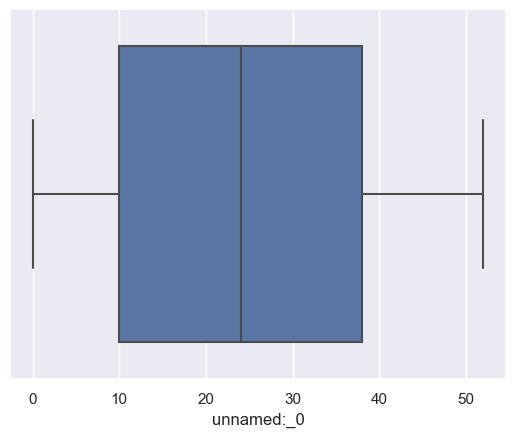

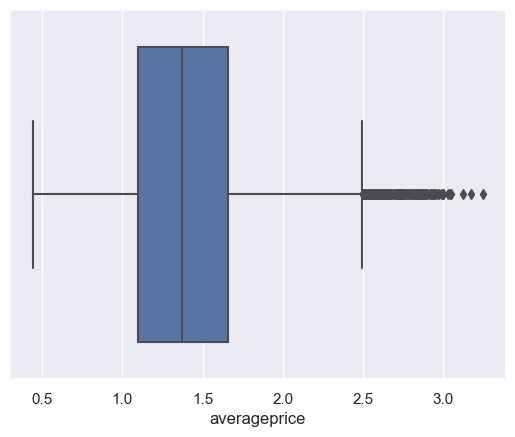

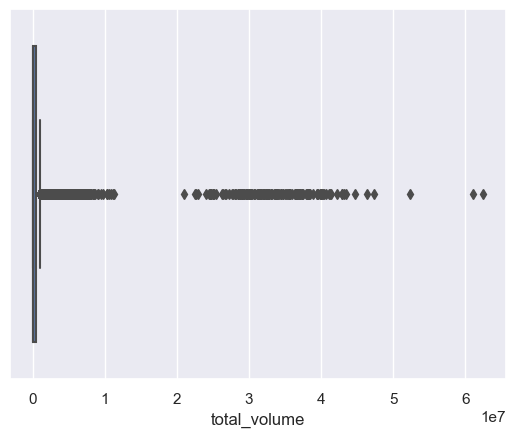

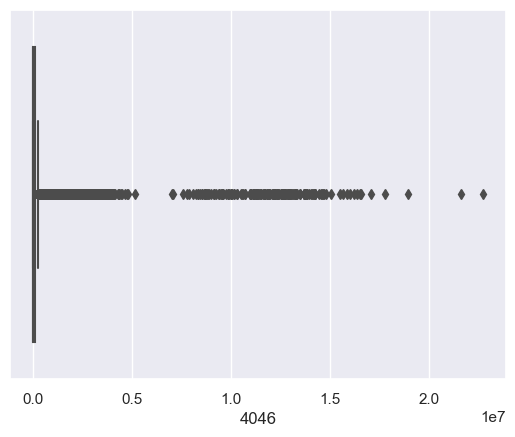

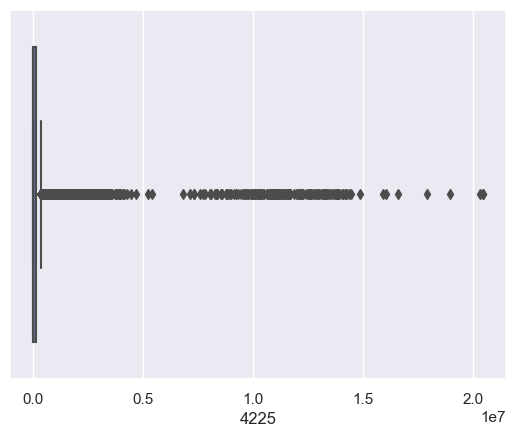

...

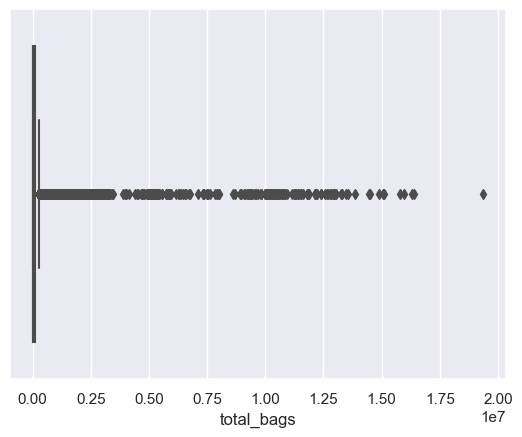

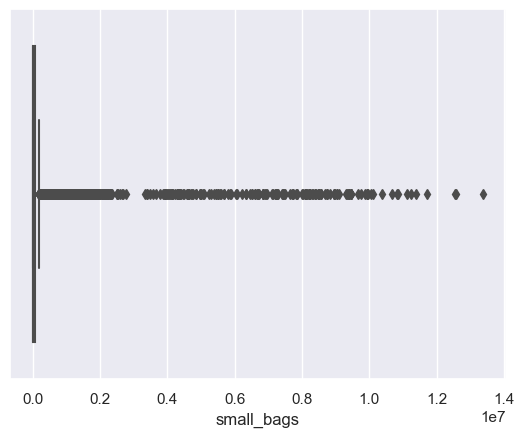

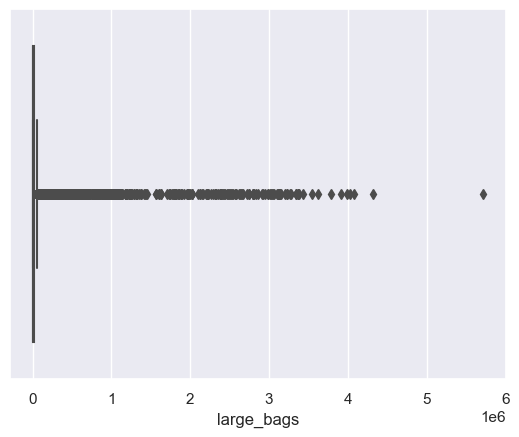

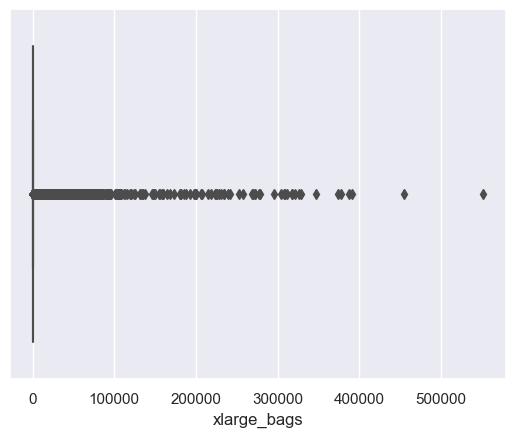

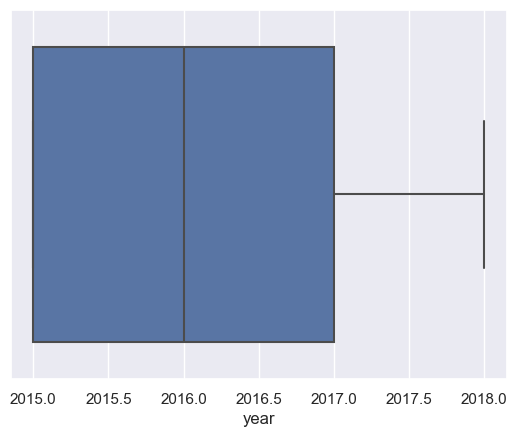

Distribution Analysis - Histogram


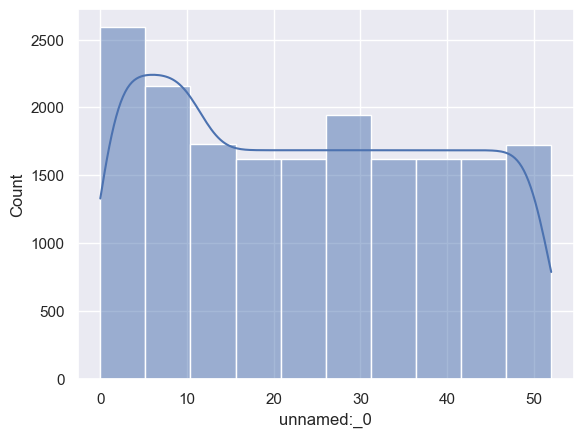

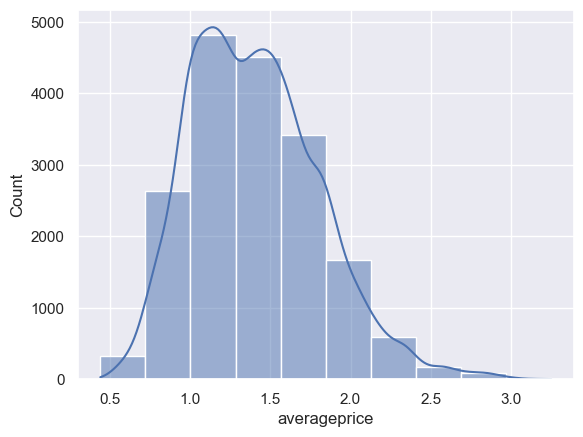

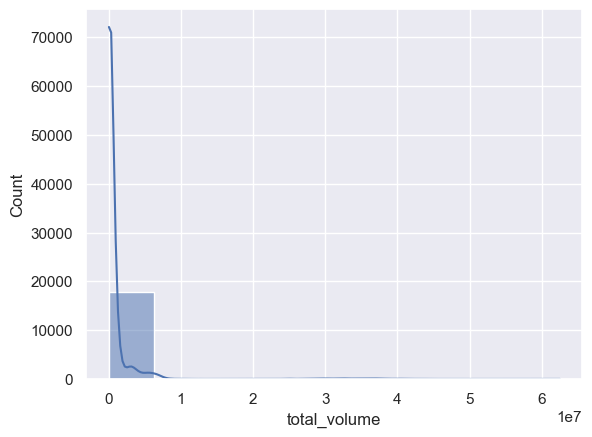

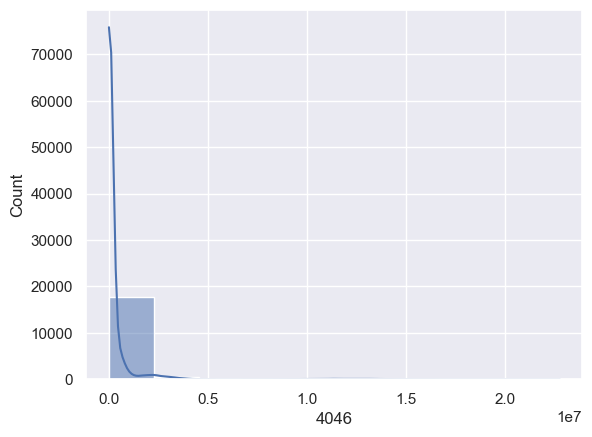

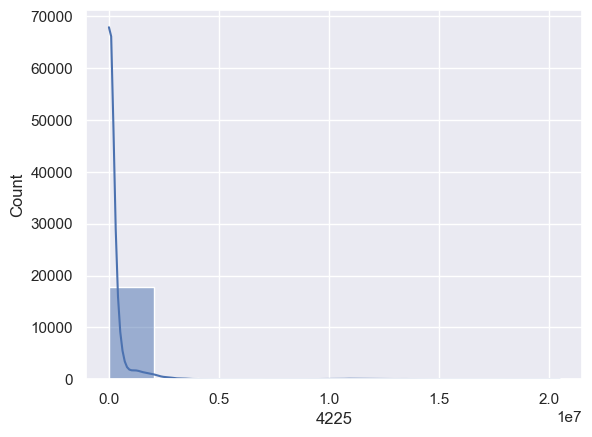

...

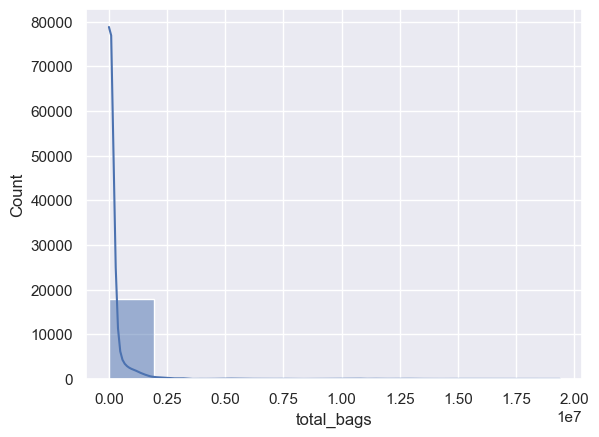

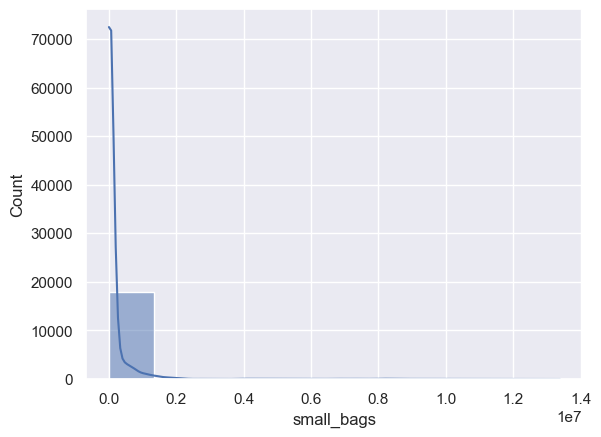

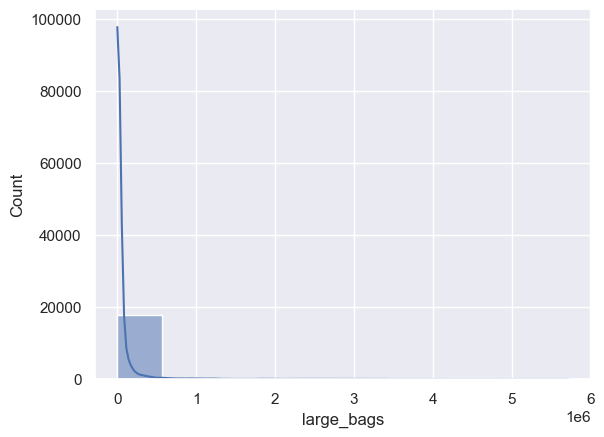

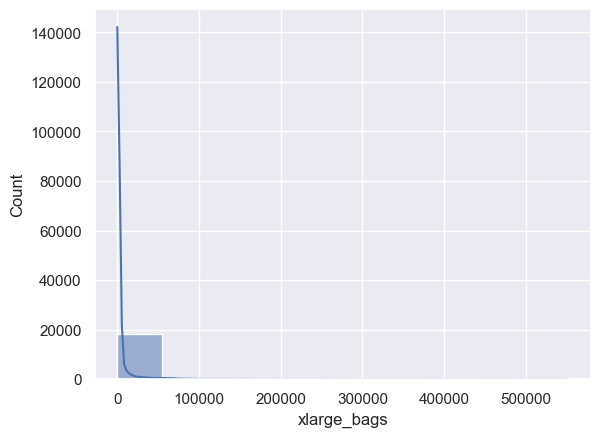

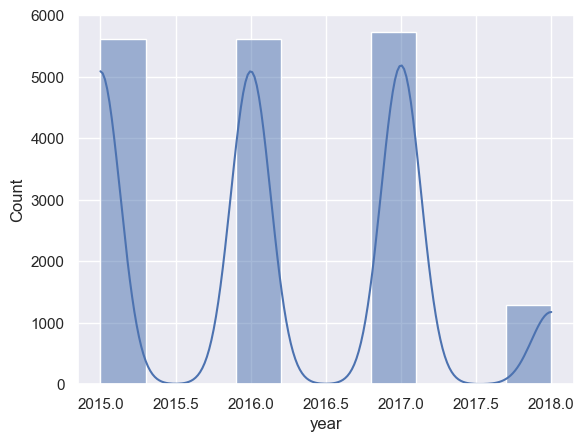

In [13]:
eda_num(avocado_df)

# Asegurar que estén los datos en orden cronológico

In [14]:
avocado_df["date"] = pd.to_datetime(avocado_df["date"])
#sort by date
avocado_df = avocado_df.sort_values(by="date")
avocado_df.head()

,unnamed:_0,date,averageprice,total_volume,4046,4225,4770,total_bags,small_bags,large_bags,xlarge_bags,type,year,region
11569,51,2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.0,organic,2015,Southeast
9593,51,2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.0,organic,2015,Chicago
10009,51,2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.0,organic,2015,HarrisburgScranton
1819,51,2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.0,conventional,2015,Pittsburgh
9333,51,2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.0,organic,2015,Boise


# Realizar una gráfica de precios promedio vrs fecha

¿Cuál es la tendencia a nivel nacional?

In [15]:
avocado_df.set_index("date", inplace=True)
avocado_series = avocado_df.groupby(avocado_df.index).mean()

C:\Users\ALIEWARE\AppData\Local\Temp\ipykernel_27740\2418458887.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



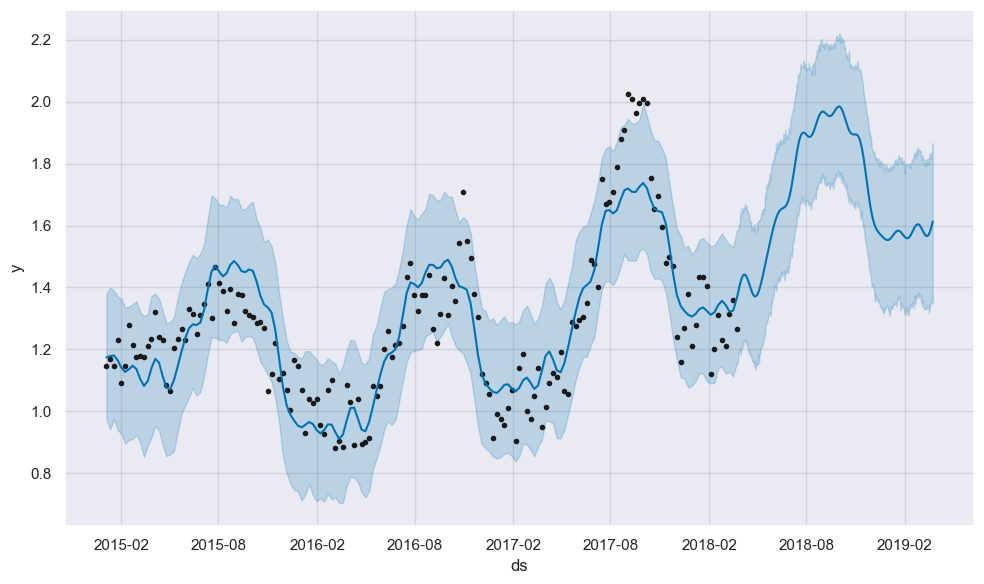

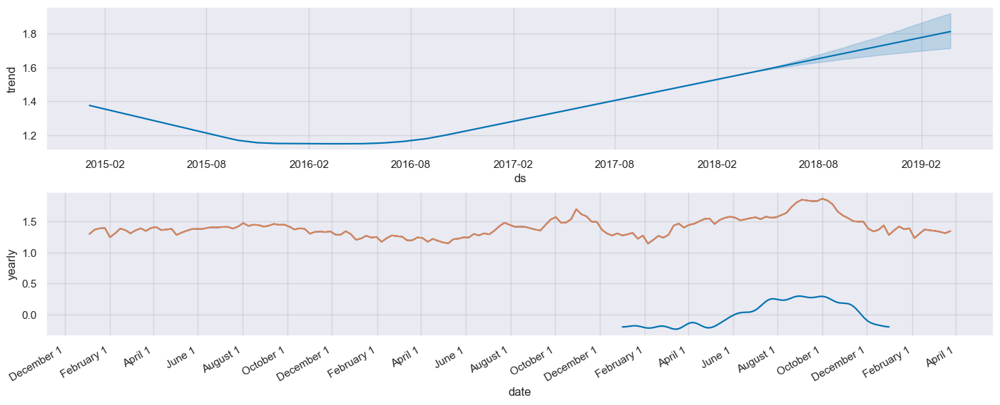

In [40]:
#Graficar precios vs fecha
avocado_series['averageprice'].plot(figsize=(15, 6))
plt.show()

# Realizar una gráfica de barras para ver el número de regiones

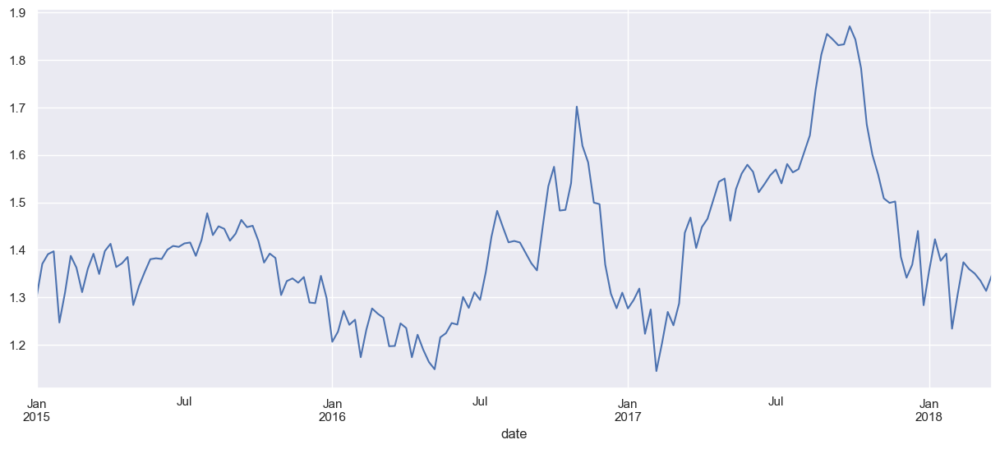

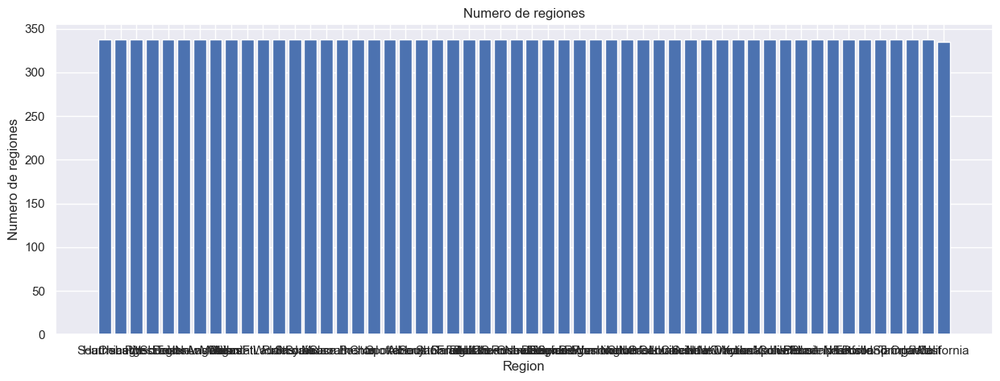

In [17]:
#Grafica de barras para numero de regiones
plt.figure(figsize=(15,5))
plt.bar(avocado_df["region"].unique(), avocado_df["region"].value_counts())
plt.title("Numero de regiones")
plt.xlabel("Region")
plt.ylabel("Numero de regiones")
plt.show()

# Realizar una gráfica de barras para ver de qué años se tiene información

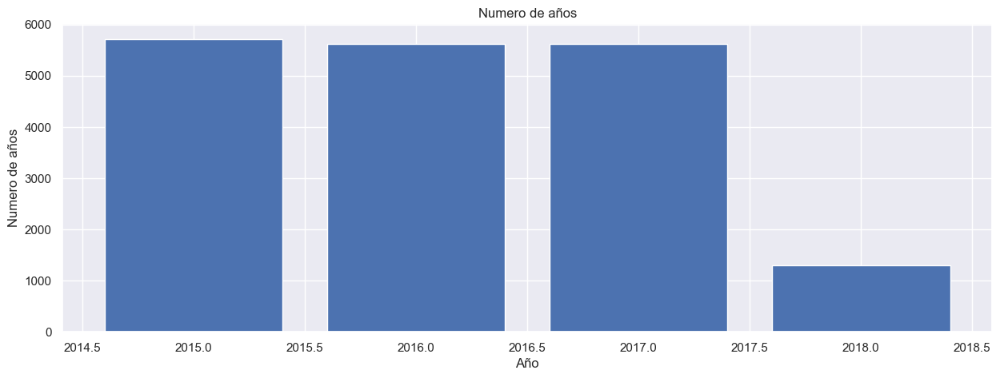

In [18]:
#Grafica de barras para ver años
plt.figure(figsize=(15,5))
plt.bar(avocado_df["year"].unique(), avocado_df["year"].value_counts())
plt.title("Numero de años")
plt.xlabel("Año")
plt.ylabel("Numero de años")
plt.show()


# Preparar los datos para que se acoplen a lo que requiere el modelo a utilizar

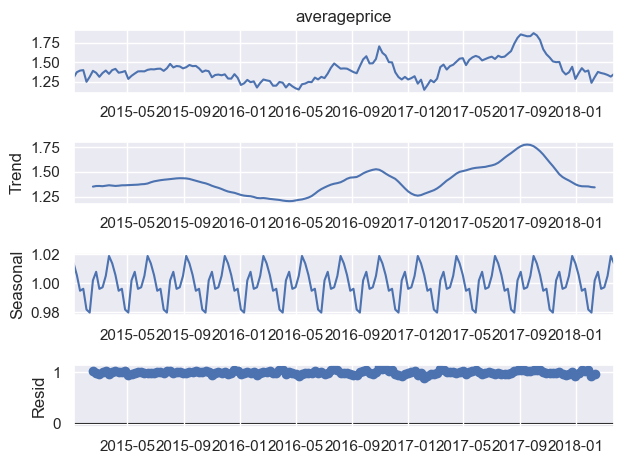

In [19]:
#Analisis de los componentes
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(avocado_series['averageprice'],period=12,model='multiplicative')
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

decomposition.plot()

In [20]:
df_prophet = avocado_series[['averageprice']].copy()
#rename
df_prophet = df_prophet.rename(columns={'averageprice':'y', 'date':'ds'})
df_prophet['date'] = df_prophet.index
df_prophet = df_prophet.reset_index(drop=True)
#rename dates 
df_prophet['ds'] = df_prophet['date']
df_prophet = df_prophet.drop(columns=['date'])
df_prophet



,y,ds
0,1.301296,2015-01-04
1,1.370648,2015-01-11
2,1.391111,2015-01-18
3,1.397130,2015-01-25
4,1.247037,2015-02-01
...,...,...
164,1.359630,2018-02-25
165,1.350185,2018-03-04
166,1.335093,2018-03-11
167,1.313704,2018-03-18


# Realizar predicciones

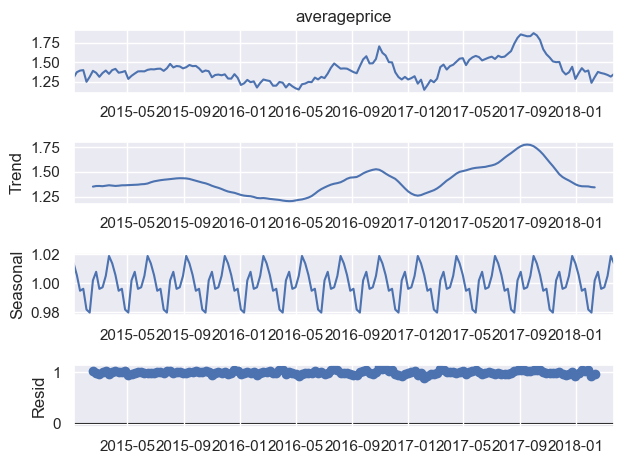

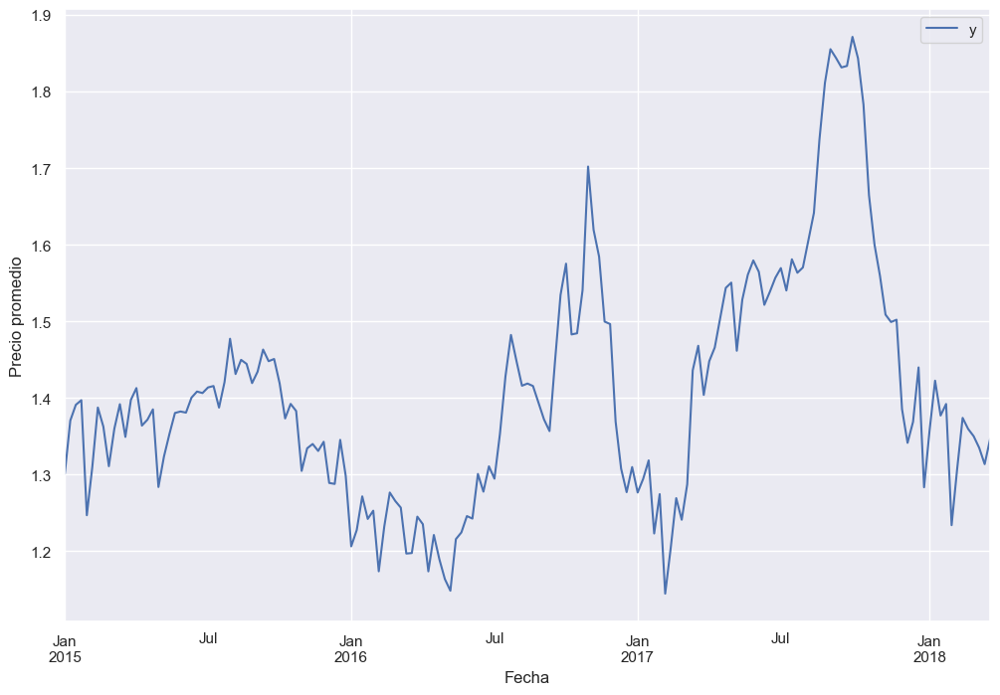

In [21]:
#Visualizar datos
ax = df_prophet.set_index('ds').plot(figsize=(12, 8))
ax.set_ylabel('Precio promedio')
ax.set_xlabel('Fecha')
plt.show()

# Creación y ajuste del modelo

In [22]:
%pip install prophet
from prophet import Prophet
my_model = Prophet(interval_width=0.95)
my_model.fit(df_prophet)
future_dates = my_model.make_future_dataframe(periods=365)
future_dates.tail()


[notice] A new release of pip available: 22.2.1 -> 22.3
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached prophet-1.1.1-cp310-cp310-win_amd64.whl (12.1 MB)
  Using cached LunarCalendar-0.0.9-py2.py3-none-any.whl (18 kB)
  Using cached cmdstanpy-1.0.8-py3-none-any.whl (81 kB)
  Using cached holidays-0.16-py3-none-any.whl (184 kB)
  Using cached setuptools_git-1.2-py2.py3-none-any.whl (10 kB)
  Using cached convertdate-2.4.0-py3-none-any.whl (47 kB)
  Using cached PyMeeus-0.5.11.tar.gz (5.4 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached korean_lunar_calendar-0.3.1-py3-none-any.whl (9.0 kB)
  Using cached hijri_converter-2.2.4-py3-none-any.whl (14 kB)
  Using cached ephem-4.1.3-cp310-cp310-win_amd64.whl (1.4 MB)
Using legacy 'setup.py install' for pymeeus, since package 'wheel' is not installed.
  Running setup.py install for pymeeus: started
  Running setup.py install for pymeeus: finished with status 'done'
Note: you may need to restart the kernel to use updated packages.


11:36:42 - cmdstanpy - INFO - Chain [1] start processing
11:36:42 - cmdstanpy - INFO - Chain [1] done processing


,ds
529,2019-03-21
530,2019-03-22
531,2019-03-23
532,2019-03-24
533,2019-03-25


# Pronosticar hacia el futuro un año (365 días)

In [23]:
prediction = my_model.predict(future_dates)

In [24]:
prediction[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
529,2019-03-21,1.258632,1.060641,1.463100
530,2019-03-22,1.260506,1.067490,1.447098
531,2019-03-23,1.262712,1.087950,1.454589
532,2019-03-24,1.265224,1.063502,1.456164
533,2019-03-25,1.268008,1.071920,1.456168


# Graficar los datos históricos y los del futuro

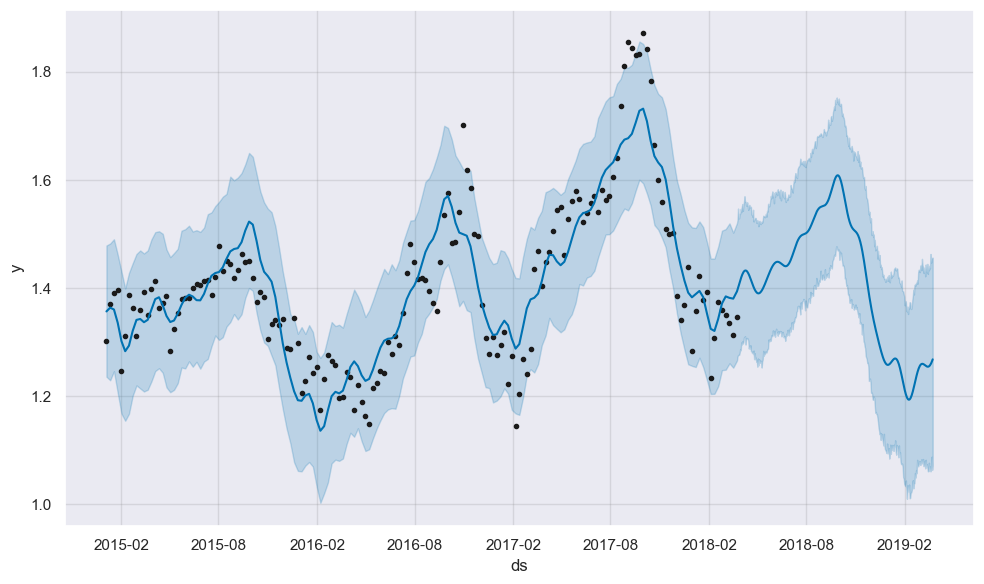

In [25]:
#plot
my_model.plot(prediction, uncertainty=True)

# Graficar los componentes del pronóstico

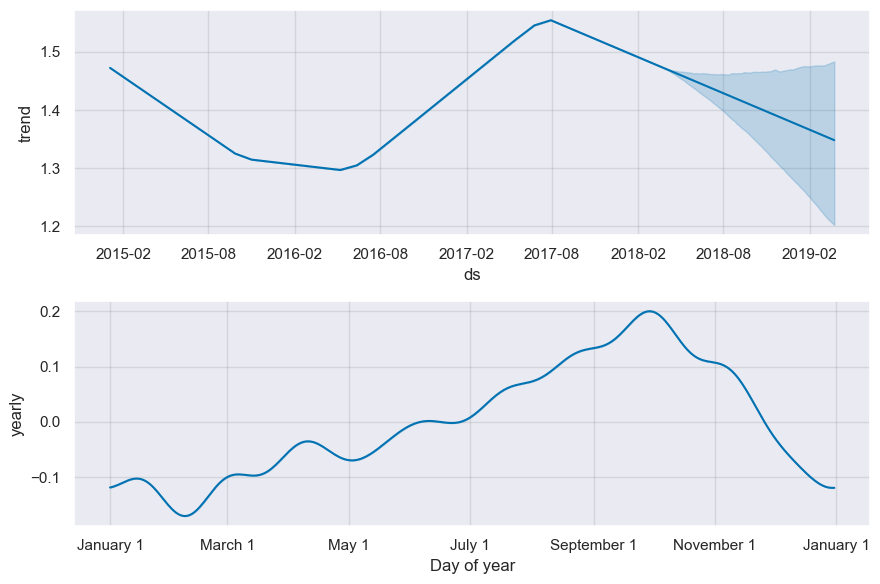

In [26]:
#plot components
my_model.plot_components(prediction)

# PARTE 2

### Repetir el ejercicio pero solo con la región oeste "West" de los EEUU

### Leer el archivo de datos

In [27]:
avocado_west_df = avocado_df[avocado_df["region"] == "West"]
avocado_west_df.head()

,unnamed:_0,averageprice,total_volume,4046,4225,4770,total_bags,small_bags,large_bags,xlarge_bags,type,year,region
date,,,,,,,,,,,,,
2015-01-04,51,1.40,187548.30,70313.71,72942.11,24.30,44268.18,10023.72,34244.46,0.00,organic,2015,West
2015-01-04,51,0.89,5794410.58,2275446.87,2582300.65,97024.09,839638.97,688813.01,150819.57,6.39,conventional,2015,West
2015-01-11,50,1.39,223156.55,80139.16,111395.01,63.88,31558.50,9296.76,22261.74,0.00,organic,2015,West
2015-01-11,50,0.95,5333097.71,2203111.92,2292761.26,127412.09,709812.44,598705.08,111073.82,33.54,conventional,2015,West
2015-01-18,49,0.96,5475363.01,2431736.63,2258069.63,76348.13,709208.62,527358.78,181809.88,39.96,conventional,2015,West


In [28]:
avocado_west_df.shape

(338, 13)

### Por si acaso no están ordenadas las observaciones

In [29]:
# order by date set in the index ascending
avocado_west_df = avocado_west_df.sort_values(by="date", ascending=True)
avocado_west_df.head()

,unnamed:_0,averageprice,total_volume,4046,4225,4770,total_bags,small_bags,large_bags,xlarge_bags,type,year,region
date,,,,,,,,,,,,,
2015-01-04,51,1.40,187548.30,70313.71,72942.11,24.30,44268.18,10023.72,34244.46,0.00,organic,2015,West
2015-01-04,51,0.89,5794410.58,2275446.87,2582300.65,97024.09,839638.97,688813.01,150819.57,6.39,conventional,2015,West
2015-01-11,50,1.39,223156.55,80139.16,111395.01,63.88,31558.50,9296.76,22261.74,0.00,organic,2015,West
2015-01-11,50,0.95,5333097.71,2203111.92,2292761.26,127412.09,709812.44,598705.08,111073.82,33.54,conventional,2015,West
2015-01-18,49,0.96,5475363.01,2431736.63,2258069.63,76348.13,709208.62,527358.78,181809.88,39.96,conventional,2015,West


# Graficar el precio promedio vs fecha

### ¿Es diferente la tendencia comparado a la tendencia nacional?

In [30]:
avocado_west_series = avocado_west_df.groupby(avocado_west_df.index).mean()

C:\Users\ALIEWARE\AppData\Local\Temp\ipykernel_27740\2940042743.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



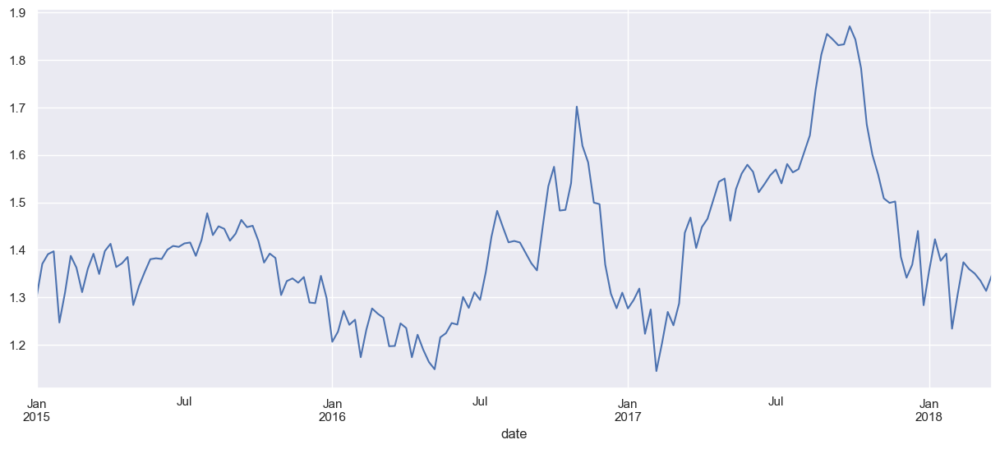

In [41]:
avocado_series['averageprice'].plot(figsize=(15, 6))
plt.show()

# Crear el modelo y ajustarlo con los datos

### Preparar los datos para que sean aceptados por el modelo a usar

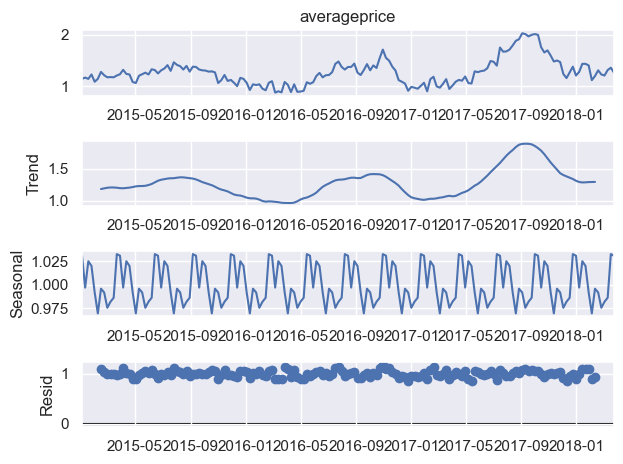

In [32]:
#Analisis de los componentes
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(avocado_west_series['averageprice'],period=12,model='multiplicative')
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

decomposition.plot()

In [33]:
df_prophet = avocado_west_series[['averageprice']].copy()
#rename
df_prophet = df_prophet.rename(columns={'averageprice':'y', 'date':'ds'})
df_prophet['date'] = df_prophet.index
df_prophet = df_prophet.reset_index(drop=True)
#rename dates 
df_prophet['ds'] = df_prophet['date']
df_prophet = df_prophet.drop(columns=['date'])
df_prophet

,y,ds
0,1.145,2015-01-04
1,1.170,2015-01-11
2,1.145,2015-01-18
3,1.230,2015-01-25
4,1.090,2015-02-01
...,...,...
164,1.230,2018-02-25
165,1.210,2018-03-04
166,1.315,2018-03-11
167,1.360,2018-03-18


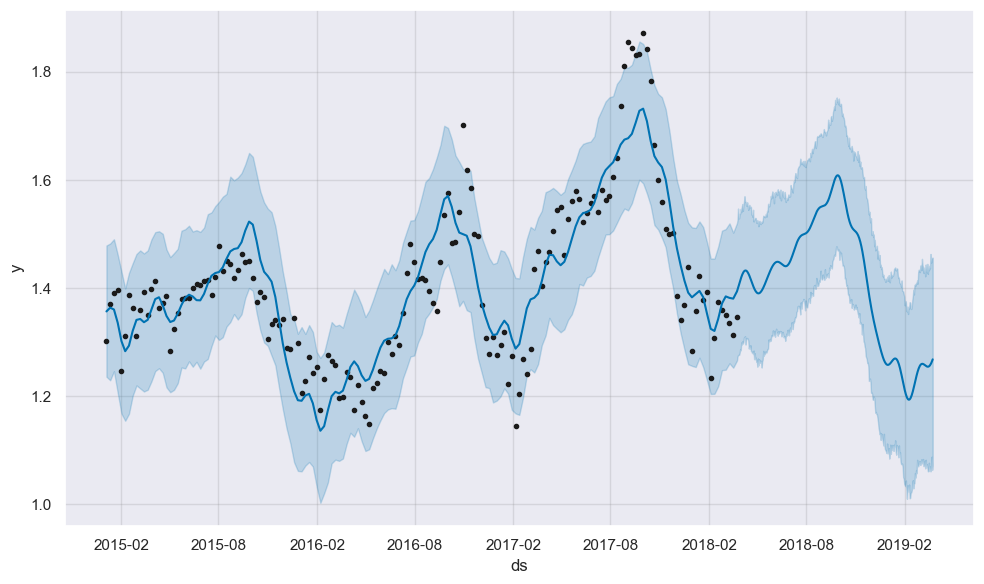

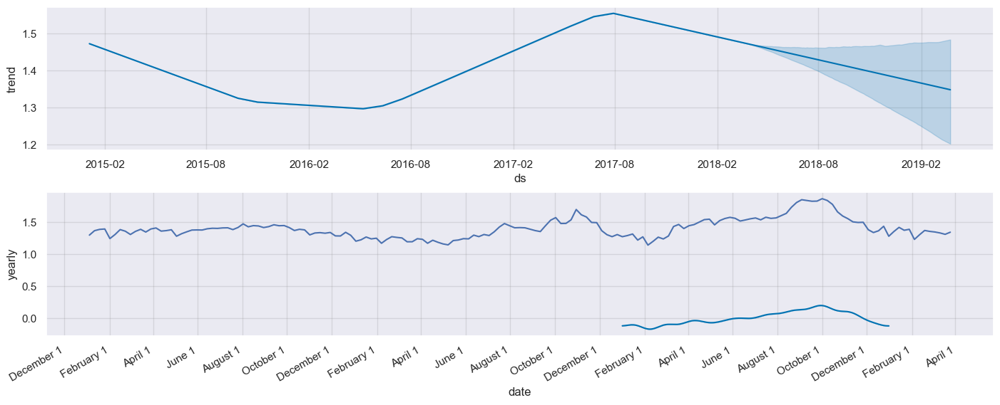

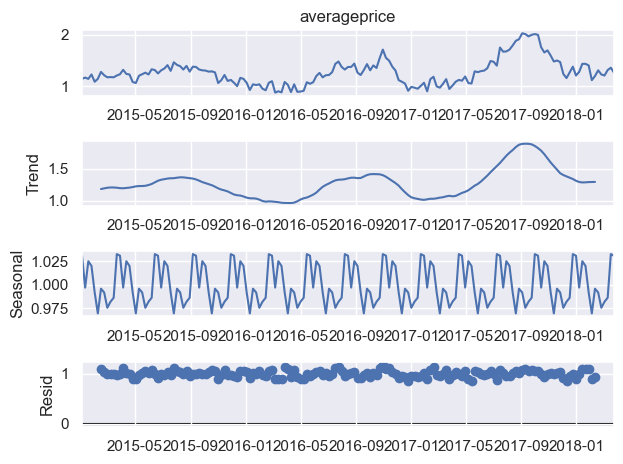

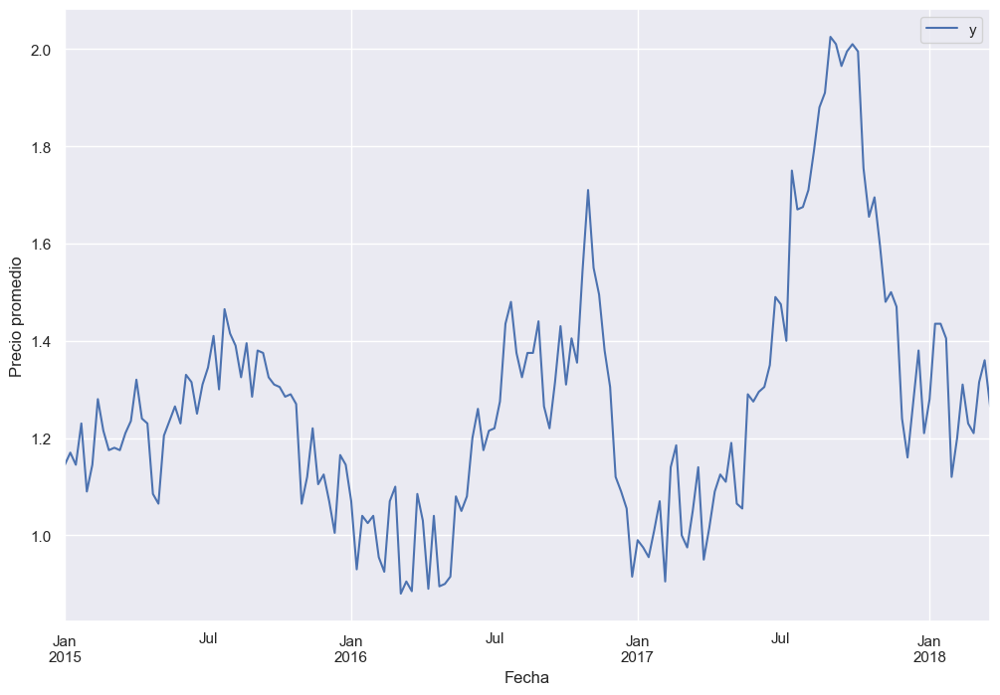

In [34]:
#Visualizar datos
ax = df_prophet.set_index('ds').plot(figsize=(12, 8))
ax.set_ylabel('Precio promedio')
ax.set_xlabel('Fecha')
plt.show()

In [35]:
my_model = Prophet(interval_width=0.95)
my_model.fit(df_prophet)
future_dates = my_model.make_future_dataframe(periods=365)
future_dates.tail()

11:36:50 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing


,ds
529,2019-03-21
530,2019-03-22
531,2019-03-23
532,2019-03-24
533,2019-03-25


# Pronosticar al futuro un año (365 días)

In [36]:
prediction = my_model.predict(future_dates)
prediction[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
529,2019-03-21,1.585820,1.343520,1.813744
530,2019-03-22,1.591835,1.355543,1.831831
531,2019-03-23,1.598465,1.354944,1.832454
532,2019-03-24,1.605606,1.369639,1.835466
533,2019-03-25,1.613141,1.348169,1.866027


# Graficar datos históricos y pronosticados

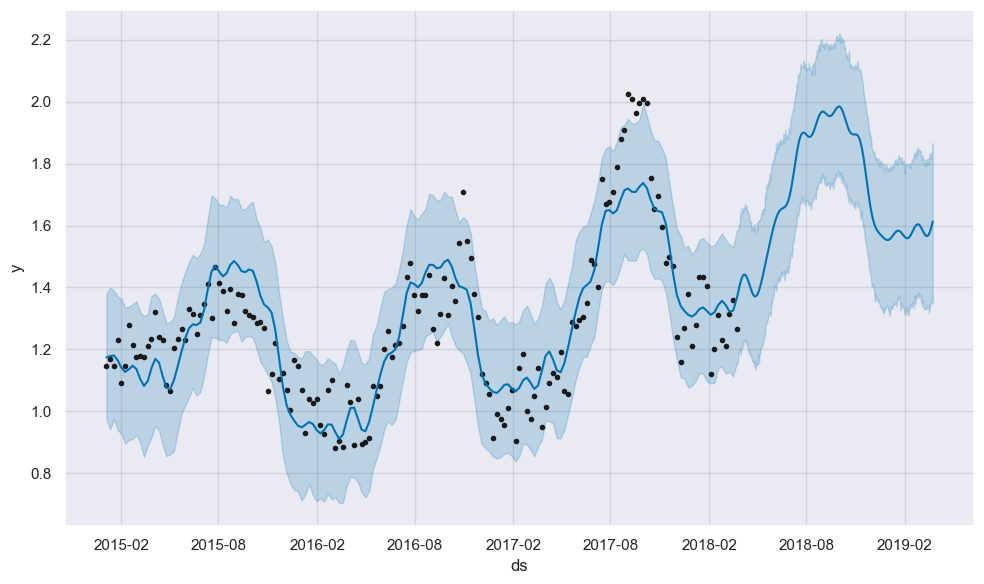

In [37]:
#plot
my_model.plot(prediction, uncertainty=True)

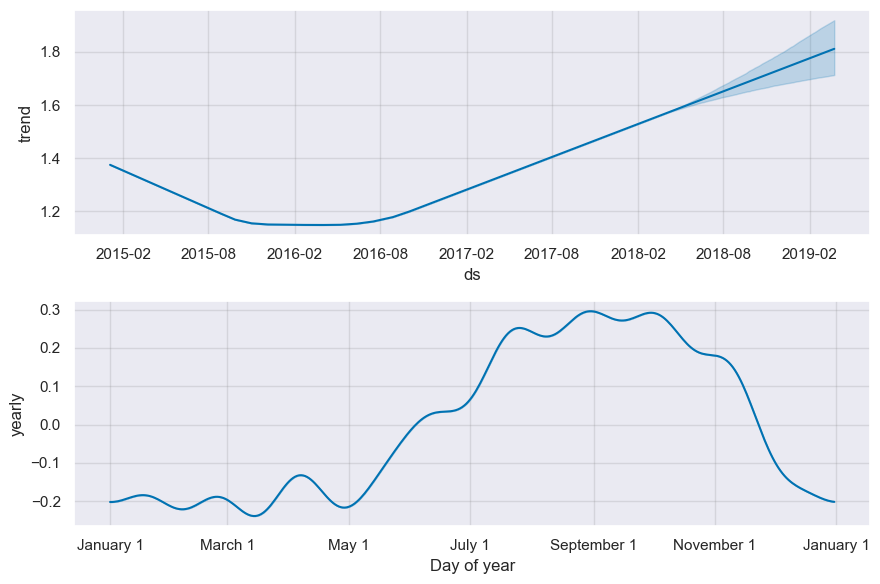

In [38]:
#plot components
my_model.plot_components(prediction)